# Import

In [2]:
from phc_nzi.photonic_crystal_maker import (Material, Geometry, PhotonicCrystal, 
                                        ScriptParam, ScriptParamVector3, BaseDielectricDistribution,
                                        HexagonalLattice)
import meep as mp
from phc_nzi.mpb_configurator import *
from phc_nzi.mpi_differential_evolution import MPIdeOptimizator
from phc_nzi.simulation_handler import LSFJobConfiguration, MPBDataOptions, Simulation
from phc_nzi.optimization_data_analyzer import OptimizationDataAnalyzer
from phc_nzi.simulation_viewer import SimulationViewer
from phc_nzi.lsf_sweeper import LSFSweeper

import numpy as np
import matplotlib.pyplot as plt
import os
import matplotlib.colors as colors
plt.rcParams["font.size"] = 15

# k Points Functions

In [3]:

def make_kpoints_vector3(kpoints):
    """
    Convert a list of k-points to a list of Vector3 objects.

    Parameters
    ----------
    kpoints : (N, 2) ndarray
        Array of (k_x, k_y) coordinates in reduced units.

    Returns
    -------
    kpoints_vector3 : list of mp.Vector3
        List of Vector3 objects representing the k-points.
    """
    return [mp.Vector3(k[0], k[1], 0) for k in kpoints]

def generate_ibz_kpoints(nx, ny, centered=False):
    """
    Generate k-points in the irreducible Brillouin zone (IBZ) 
    of a 2D square (C4v) lattice, ensuring (0,0) is included.

    Parameters
    ----------
    nx, ny : int
        Number of divisions along k_x and k_y in the full BZ grid.
        The actual number of points in the IBZ will be approximately nx*ny/8.
    centered : bool, default=False
        If True, use midpoints of each cell: k_i = (i+0.5)/N - 0.5.
        If False, use endpoints:       k_i = i/N       - 0.5.

    Returns
    -------
    ibz_kpts : (M, 2) ndarray
        Array of (k_x, k_y) coordinates in reduced units 
        lying in the IBZ wedge 0 ≤ k_y ≤ k_x ≤ 0.5, 
        with (0,0) always present.
    """
    # 1) Build full grid in the square BZ
    if centered:
        kx_vals = (np.arange(nx) + 0.5)/nx - 0.5
        ky_vals = (np.arange(ny) + 0.5)/ny - 0.5
    else:
        kx_vals = np.arange(nx)/nx - 0.5
        ky_vals = np.arange(ny)/ny - 0.5

    kxg, kyg = np.meshgrid(kx_vals, ky_vals, indexing='ij')
    all_pts = np.vstack([kxg.ravel(), kyg.ravel()]).T

    # 2) Select only the IBZ wedge: 0 ≤ ky ≤ kx ≤ 0.5
    mask = (all_pts[:,1] >= 0) & (all_pts[:,0] >= all_pts[:,1]) & (all_pts[:,0] <=  0.5)
    ibz_kpts = all_pts[mask]

    # 3) Sort (first by kx, then ky) for consistency
    ibz_kpts = ibz_kpts[np.lexsort((ibz_kpts[:,1], ibz_kpts[:,0]))]
    print("shape of kpoints: ", ibz_kpts.shape) 
    return ibz_kpts

def generate_bz_kpoints(nx, ny, centered=False):
    """
    Generate k-points in the full Brillouin zone (BZ) 
    of a 2D square (C4v) lattice, ensuring (0,0) is included.

    Parameters
    ----------
    nx, ny : int
        Number of divisions along k_x and k_y in the full BZ grid.
        The actual number of points in the BZ will be approximately nx*ny.
    centered : bool, default=False
        If True, use midpoints of each cell: k_i = (i+0.5)/N - 0.5.
        If False, use endpoints:       k_i = i/N       - 0.5.

    Returns
    -------
    bz_kpts : (M, 2) ndarray
        Array of (k_x, k_y) coordinates in reduced units 
        lying in the full BZ wedge -0.5 ≤ k_x ≤ 0.5 and -0.5 ≤ k_y ≤ 0.5.
    """
    # 1) Build full grid in the square BZ
    if centered:
        kx_vals = (np.arange(nx) + 0.5)/nx - 0.5
        ky_vals = (np.arange(ny) + 0.5)/ny - 0.5
    else:
        kx_vals = np.arange(nx)/nx - 0.5
        ky_vals = np.arange(ny)/ny - 0.5

    kxg, kyg = np.meshgrid(kx_vals, ky_vals, indexing='ij')
    all_pts = np.vstack([kxg.ravel(), kyg.ravel()]).T

    # 2) Select only the BZ wedge: -0.5 ≤ kx ≤ 0.5 and -0.5 ≤ ky ≤ 0.5
    mask = (all_pts[:,1] >= -0.5) & (all_pts[:,1] <= 0.5) & \
           (all_pts[:,0] >= -0.5) & (all_pts[:,0] <= 0.5)
    bz_kpts = all_pts[mask]

    # 3) Sort (first by kx, then ky) for consistency
    bz_kpts = bz_kpts[np.lexsort((bz_kpts[:,1],
                                    bz_kpts[:,0]))]
    print("shape of kpoints: ", bz_kpts.shape)
    return bz_kpts



def generate_circle_k_points(resolution, radius):
    """
    Generates k-points in a circle within the first Brillouin zone.

    Parameters:
        resolution (int): Number of points to generate along each axis.
        radius (float): Radius of the circle in k-space (reciprocal lattice units).

    Returns:
        numpy.ndarray: An array of k-points (kx, ky) within the circle.
    """
    # Create a grid of k-points
    kx_vals = np.linspace(-0.5, 0.5, resolution)
    ky_vals = np.linspace(-0.5, 0.5, resolution)
    kxg, kyg = np.meshgrid(kx_vals, ky_vals)
    kpoints = np.stack((kxg, kyg), axis=-1)

    # Calculate the magnitude of each k-point
    k_magnitudes = np.linalg.norm(kpoints, axis=-1)

    # Select k-points within the circle
    inside_circle = k_magnitudes <= radius
    kpoints_inside = kpoints[inside_circle]

    return kpoints_inside



# Config

3.0753321000000002
Epsilon of InP:  9.46
shape of kpoints:  (225, 2)


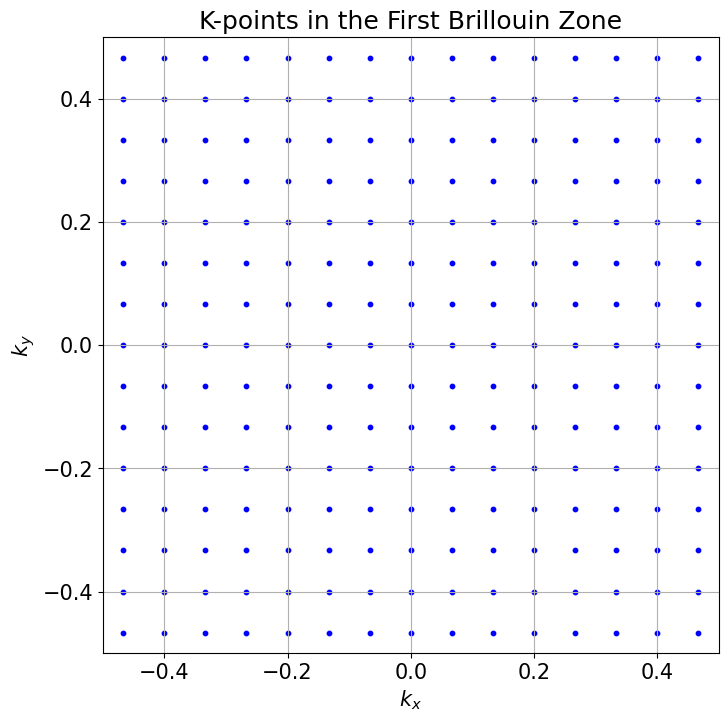

COMMANDS ['(define-param h 1e+20)', '(define-param r1 0.1)', '(define-param r2 0.2)']


In [10]:


T = 4
n_InP = 3.075*(1+2.7e-5*T)
print(n_InP)
eps = round(n_InP**2,2)
print("Epsilon of InP: ", eps)
InP = Material(epsilon = eps)
air = Material(epsilon = 1)
## Simulation Name: 
name = "C4v_diatomic_T4"

## Define the geometry
radius1 = ScriptParam("r1", 0.3)
radius2 = ScriptParam("r2", 0.2)
height_supercell = 3
height_slab = ScriptParam("h", 0.4)
slab_block_size = ScriptParamVector3(1e20, 1e20, "h", z_def = 0.4)

## Define the lattice

lattice_2D = SquareLattice()



center = mp.Vector3(0,0,0)
geom = BaseDielectricDistribution(eps_bulk = eps).make_C4v_diatomic_B()
photonic_crystal = PhotonicCrystal(lattice=lattice_2D, atoms=geom)



# Generate k-points in the irreducible Brillouin zone
nx, ny = 15, 15
kpoints_array = generate_bz_kpoints(nx, ny, centered=True)
#kpoints_array = generate_circle_k_points(resolution=15, radius=0.2)
kpoints = make_kpoints_vector3(kpoints_array)

# plot the k-points 
plt.figure(figsize=(8, 8))
plt.scatter(kpoints_array[:, 0], kpoints_array[:, 1], marker='o', color='blue', s=10)
plt.xlim(-0.5, 0.5)
plt.ylim(-0.5, 0.5)
plt.xlabel(r'$k_x$')
plt.ylabel(r'$k_y$')
plt.title('K-points in the First Brillouin Zone')
plt.grid()
plt.gca().set_aspect('equal', adjustable='box')
plt.show()

## Define the simulation
configuration_options= dict(
    resolution = 32, 
    num_bands=10,
    k_points=kpoints,
    k_points_interpolation_factor=None,
    extra_runner_command = "fix-efield-phase output-efield"
    
)



mpb_configuration = MPBSchemeConfigurator(photonic_crystal, ["te"], **configuration_options)
script = mpb_configuration.get_scheme_config(join_newline=True)
dos_script = """
(include "dos.scm")
(print-dos 0 1 100)

"""

script = script + "\n" + dos_script

# Set up the simulation with the MPB script

name = "band3D"





# Run

In [12]:

data_rooth = "/work3/s232699/phc_nzi/test/"
os.makedirs(data_rooth, exist_ok=True)

simulation = Simulation(
    simulation_name=name,
    script = script,
    directory= os.path.join(data_rooth, name)
    )

numproc= 32
pop = numproc // 2
lsf_config = LSFJobConfiguration(num_processors=numproc, span_option="block", span_value=8, queue="fotonano")

r1 = 0.24
r2 = 0.2344
#simulation.run_hpc(mpb_command_line_params=dict(r1=r1, r2=r2))
viewer = SimulationViewer(simulation)
df = simulation.load_frequency_data("te")
display(df)


,k index,k1,k2,k3,kmag/2pi,te band 1,te band 2,te band 3,te band 4,te band 5,te band 6,te band 7,te band 8,te band 9,te band 10
0,1,-0.466667,-0.466667,0,0.659966,0.251981,0.256235,0.370834,0.373507,0.624870,0.631990,0.652494,0.658641,0.689179,0.694796
1,2,-0.466667,-0.400000,0,0.614636,0.244104,0.255842,0.374538,0.381723,0.616221,0.625655,0.653814,0.666271,0.685407,0.696362
2,3,-0.466667,-0.333333,0,0.573488,0.234296,0.251753,0.383681,0.393693,0.604690,0.613835,0.658686,0.668550,0.686480,0.697025
3,4,-0.466667,-0.266667,0,0.537484,0.224237,0.245789,0.396247,0.407665,0.591598,0.600147,0.661787,0.666024,0.693953,0.698059
4,5,-0.466667,-0.200000,0,0.507718,0.215188,0.239642,0.410122,0.422088,0.577944,0.586128,0.658864,0.667040,0.700573,0.703126
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
220,221,0.466667,0.200000,0,0.507718,0.215191,0.239659,0.410205,0.422176,0.577903,0.586129,0.658775,0.666989,0.700571,0.703176
221,222,0.466667,0.266667,0,0.537484,0.224237,0.245802,0.396339,0.407762,0.591548,0.600131,0.661728,0.665971,0.693997,0.698055
222,223,0.466667,0.333333,0,0.573488,0.234292,0.251761,0.383781,0.393795,0.604629,0.613802,0.658672,0.668522,0.686491,0.697010
223,224,0.466667,0.400000,0,0.614636,0.244097,0.255845,0.374644,0.381829,0.616146,0.625594,0.653838,0.666327,0.685351,0.696335


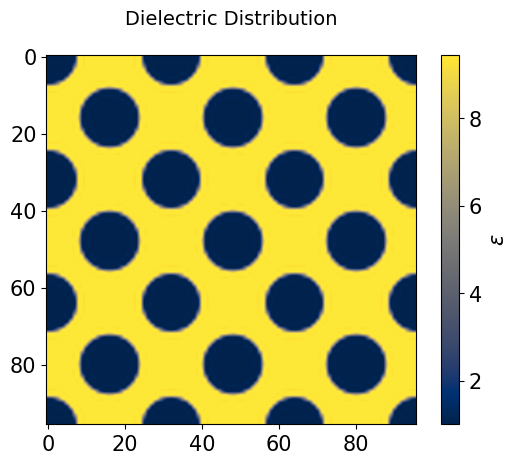

In [13]:
viewer.plot_epsilon_2d()
plt.show()

In [46]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.colors import TwoSlopeNorm
from scipy.interpolate import griddata
import sys
np.set_printoptions(threshold=sys.maxsize)
from matplotlib._layoutgrid import plot_children

%matplotlib inline
%config InlineBackend.figure_format = 'svg'           # crisp lines
%config InlineBackend.print_figure_kwargs = {'dpi': 150}

plt.rcParams.update(plt.rcParamsDefault)  # reset to defaults
plt.rcParams["font.size"] = 18


%config InlineBackend.figure_format = 'svg'
def _plot_band_with_interp(ax, k1_vals, k2_vals, Z,
                           cmap, norm, N=150, k_max=None):
    """
    Interpolate Z(k1,k2) → smooth grid.  If k_max is given,
    build the grid in (r,φ) so that points lie on a circle of radius k_max.
    """
    # 1) original points, drop NaNs
    K1, K2 = np.meshgrid(k1_vals, k2_vals)
    pts  = np.vstack([K1.ravel(), K2.ravel()]).T
    vals = Z.ravel()
    mask = ~np.isnan(vals)
    pts, vals = pts[mask], vals[mask]

    # 2) build a circular grid if k_max provided, else rectangular
    if k_max is not None:
        # polar grid
        r   = np.linspace(0, k_max, N)
        phi = np.linspace(0, 2*np.pi, N)
        R, Phi = np.meshgrid(r, phi)
        XI = (R * np.cos(Phi))
        YI = (R * np.sin(Phi))
    else:
        # Cartesian grid
        xi = np.linspace(k1_vals.min(), k1_vals.max(), N)
        yi = np.linspace(k2_vals.min(), k2_vals.max(), N)
        XI, YI = np.meshgrid(xi, yi)

    # 3) interpolate (cubic + nearest fallback)
    ZI = griddata(pts, vals, (XI, YI), method='cubic')
    # if np.any(np.isnan(ZI)):
    #     ZI_nn = griddata(pts, vals, (XI, YI), method='nearest')
    #     ZI[np.isnan(ZI)] = ZI_nn[np.isnan(ZI)]

    # 4) plot with facecolors from shared norm/cmap
    surf = ax.plot_surface(
        XI, YI, ZI,
        facecolors=cm.get_cmap(cmap)( norm(ZI) ),
        rcount=N, ccount=N,
        linewidth=0, antialiased=False, shade=False, alpha=0.9,
        edgecolor="none",   
    )
    return surf


def plot_bands_surface_IBZ(
    df,
    bands: None| list=None,
    theta: float = None,
    phi: float = None,
    k_max: float = None,
    highlight_freq: float = None,
    cmap: str = "coolwarm",
    N: int = 100,
    polarization: str = "te",
):
    """
    3D TE-band surfaces colored by ω, with a single shared colorbar
    and an optional highlighted frequency ω₀ at the map center.
    """
    # 1) filter by k_max
    if k_max is not None:
        df = df[df["kmag/2pi"] <= k_max]

    # 2) pick your band columns
    if bands is None:
        band_cols = sorted(c for c in df.columns if c.startswith("te band"))
    else:
        band_cols = [f"{polarization} band {i}".strip() for i in bands]

    # 3) compute global ω-min and ω-max across *all* bands
    all_mins, all_maxs = [], []
    for band in band_cols:
        Z = df.pivot(index="k2", columns="k1", values=band).values
        all_mins.append(np.nanmin(Z))
        all_maxs.append(np.nanmax(Z))
    global_min = min(all_mins)
    global_max = max(all_maxs)

    # 4) set up a single Normalization
    if highlight_freq is not None:
        norm = TwoSlopeNorm(vmin=global_min,
                            vcenter=highlight_freq,
                            vmax=global_max)
    else:
        # linear from min→max
        from matplotlib.colors import Normalize
        norm = Normalize(vmin=global_min, vmax=global_max)

    # 5) plot all surfaces with the same cmap & norm
    fig = plt.figure(figsize=(12, 10), constrained_layout=False)
    gs = fig.add_gridspec(1, 1, left=0.3, right=0.9, wspace = 0.1)
    ax = fig.add_subplot(gs[0, 0], projection="3d")


    print(fig.get_children())

    for band in band_cols:
        pivot = df.pivot(index="k2", columns="k1", values=band)
        k2_vals, k1_vals = pivot.index.values, pivot.columns.values
        Z = pivot.values

        _plot_band_with_interp(
        ax, k1_vals, k2_vals, Z,
        cmap, norm,
        N=N,
        k_max=k_max
        )

    
        

    # 6) labels & view
    ax.set_xlabel('$k_x a/2\pi$')
    ax.set_ylabel('$k_y a/2\pi$')
    ax.set_zlabel('$\omega a/2\pi c$')
    ax.set_title('TE Bands forming the Dirac Like Cone, \n 2D Photonic Crystal')

    if theta is not None and phi is not None:
        ax.view_init(elev=theta, azim=phi)

    # 7) single shared colorbar
    mappable = cm.ScalarMappable(norm=norm, cmap=cmap)
    mappable.set_array([])    # no data needed here
    cbar = fig.colorbar(mappable, ax=ax, shrink=0.6, aspect=10, pad=0.02)
    cbar.set_label('$\omega\, (a/2\pi c)$')
    plt.grid(False)
    fig.set_layout_engine('none')

    # 1) re-draw the colorbar with a smaller width and less pad:
    cbar.remove()  
    cbar = fig.colorbar(
        mappable,
        ax=ax,
        shrink=0.5,
        aspect=20,     # make it thinner (higher aspect ratio)
        pad=0.05       # tiny gap between axes and bar
    )
    cbar.set_label('$\\omega a/2\\pi c$')



    # 3) if your x-label is still hugging, add more labelpad:
    ax.xaxis.labelpad = 25
    ax.yaxis.labelpad = 25
    ax.zaxis.labelpad = 10
    fig = ax.get_figure()
    fig.set_size_inches(12, 8)
    fig.tight_layout()

    plt.show()
    



# Example usage:

omega_d = df[df["kmag/2pi"] == 0]["band 11"].values[0]
plot_bands_surface_IBZ(df, [9,10,11,12,13], theta=15, phi=30, k_max=0.18, highlight_freq=omega_d, cmap = "Spectral", polarization="")

[<matplotlib.patches.Rectangle object at 0x7f9eeff379d0>, <Axes3D: >]


/tmp/ipykernel_232018/1445218830.py:55: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  facecolors=cm.get_cmap(cmap)( norm(ZI) ),
/tmp/ipykernel_232018/1445218830.py:166: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


Smallest representable positive float64 value: 2.2250738585072014e-308


,k index,k1,k2,k3,kmag/2pi,band 1,band 2,band 3,band 4,band 5,...,band 11,band 12,band 13,band 14,band 15,band 16,band 17,band 18,band 19,band 20
0,1,-0.071429,-0.142857,0,0.159719,0.062685,0.069626,0.307625,0.346075,0.360791,...,0.533112,0.540144,0.550766,0.567358,0.603497,0.607790,0.628760,0.660532,0.706714,0.731814
1,2,0.000000,-0.142857,0,0.142857,0.056087,0.062387,0.309170,0.348170,0.369568,...,0.529076,0.544319,0.548451,0.564850,0.599047,0.603994,0.633911,0.654949,0.713174,0.733141
2,3,0.071429,-0.142857,0,0.159719,0.062685,0.069628,0.307625,0.346078,0.360791,...,0.533089,0.540144,0.550764,0.567358,0.603497,0.607770,0.628799,0.660489,0.706714,0.731814
3,4,-0.142857,-0.071429,0,0.159719,0.062685,0.069626,0.307625,0.346075,0.360791,...,0.533112,0.540144,0.550766,0.567358,0.603497,0.607791,0.628760,0.660532,0.706714,0.731814
4,5,-0.071429,-0.071429,0,0.101015,0.039688,0.044087,0.320551,0.358240,0.362039,...,0.527537,0.530238,0.536193,0.559554,0.592684,0.616019,0.620359,0.649828,0.720936,0.738956
5,6,0.000000,-0.071429,0,0.071429,0.028074,0.031211,0.325216,0.361980,0.366918,...,0.527191,0.530122,0.532641,0.556814,0.588188,0.614061,0.623810,0.644116,0.728710,0.741263
6,7,0.071429,-0.071429,0,0.101015,0.039688,0.044089,0.320551,0.358245,0.362039,...,0.527536,0.530226,0.536180,0.559554,0.592684,0.616053,0.620349,0.649781,0.720936,0.738956
7,8,0.142857,-0.071429,0,0.159719,0.062685,0.069628,0.307625,0.346090,0.360791,...,0.533111,0.540145,0.550726,0.567358,0.603497,0.607859,0.628708,0.660477,0.706714,0.731814
8,9,-0.142857,0.000000,0,0.142857,0.056087,0.062387,0.309170,0.348170,0.369568,...,0.529076,0.544319,0.548450,0.564850,0.599047,0.603994,0.633911,0.654949,0.713174,0.733141
9,10,-0.071429,0.000000,0,0.071429,0.028074,0.031211,0.325216,0.361980,0.366918,...,0.527191,0.530123,0.532641,0.556814,0.588188,0.614061,0.623810,0.644116,0.728710,0.741263


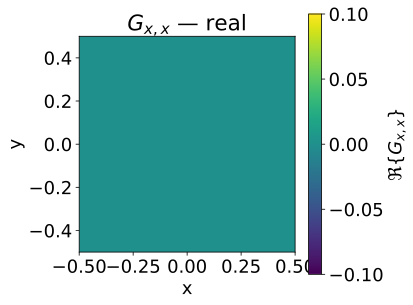

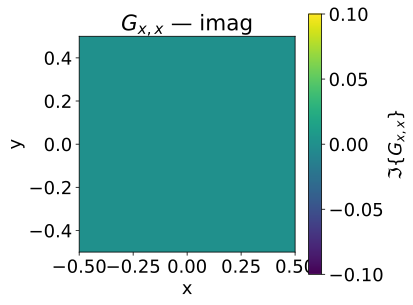

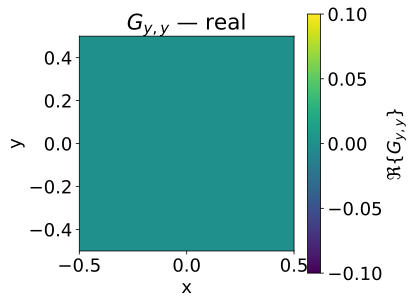

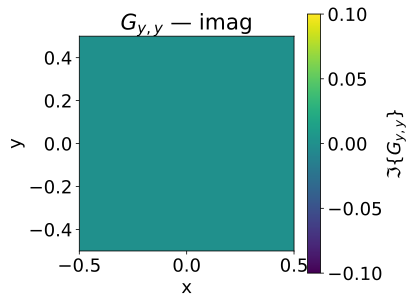

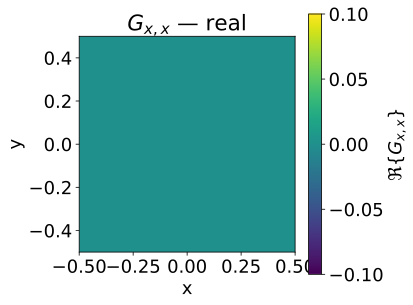

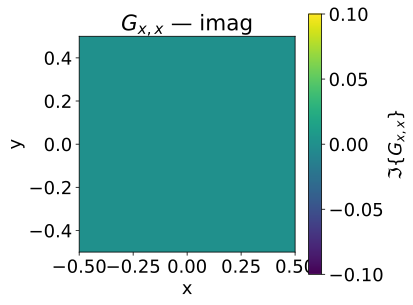

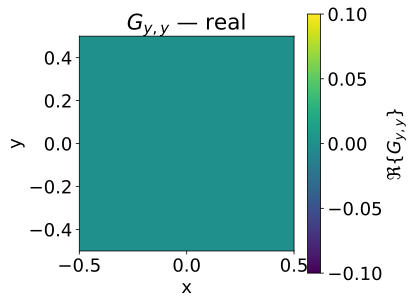

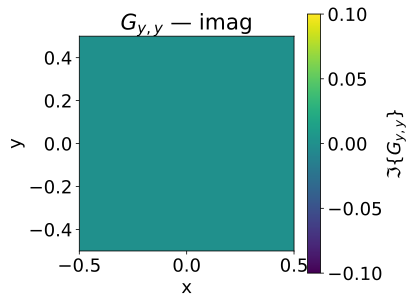

In [56]:
display(df)

def compute_green_tensor(u0, df, simulation,  gamma=np.finfo(np.float64).tiny, polarization="te"):
    """
    Compute the MPB-normalized Green's tensor G_{ij}(r; u0) 
    on the simulation grid. Returns an array of shape (3,3,Nx,Ny,Nz).
    """
    k_indices = df["k index"].unique()
    Nk = len(k_indices)

    # Load one field to get the grid shape
    first_k = k_indices[0]
    first_band_col = next(col for col in df.columns if col.startswith(f"{polarization} band".strip()))
    first_band = int(first_band_col.split()[-1])
    if polarization == "":
        fname0 = f"{name}-e.k{first_k:02d}.b{first_band:02d}.h5"
    else:
        fname0 = f"{name}-e.k{first_k:02d}.b{first_band:02d}.{polarization}.h5"
    E0 = simulation.load_h5_data(os.path.join(simulation.directory, fname0))
    # build a (3, Nx, Ny, Nz) array for dimensions
    Ex0 = E0["x.r"] + 1j*E0["x.i"]
    Ey0 = E0["y.r"] + 1j*E0["y.i"]
    Ez0 = E0["z.r"] + 1j*E0["z.i"]
    grid_shape = Ex0.shape  # e.g. (Nx, Ny, Nz)

    # Initialize G tensor: 3×3 at every grid point
    G = np.zeros((3, 3) + grid_shape, dtype=complex)

    prefactor = 1.0 / (4 * np.pi**2 * Nk)

    for k_idx in k_indices:
        for col in df.columns:
            if not col.startswith("te band"):
                continue
            u_n = df.loc[df["k index"] == k_idx, col].item()
            band_idx = int(col.split()[-1])

            fname = f"{name}-e.k{k_idx:02d}.b{band_idx:02d}.te.h5"
            Edata = simulation.load_h5_data(os.path.join(simulation.directory, fname))
            Ex = Edata["x.r"] + 1j*Edata["x.i"]
            Ey = Edata["y.r"] + 1j*Edata["y.i"]
            Ez = Edata["z.r"] + 1j*Edata["z.i"]

            # stack into shape (3, Nx, Ny, Nz)
            E_vec = np.stack((Ex, Ey, Ez), axis=0)

            # denominator at this band/k-point
            denom = (u0**2 - u_n**2) + 1j*gamma

            # dyadic product at each point: broadcast E_vec[:,None,...]*E_vec[None,...].conj()
            # This gives an array shape (3,3,Nx,Ny,Nz)
            dyad = E_vec[:, None, ...] * np.conj(E_vec[None, :, ...])

            # accumulate into G
            G += prefactor * dyad / denom

    return G


def plot_G_component_xy(G, x, y, component=(0,0), cmap='viridis',
                               plot_type='real', interpolation='bilinear'):
    """
    Plot the G_ij component of the Green's tensor over the x–y plane at fixed z,
    using imshow with interpolation for a smoother appearance.
    """
    i, j = component
    data = G[i, j, :, :]
    
    if plot_type == 'real':
        data_to_plot = np.real(data)
        label = f'$\\Re\\{{G_{{{["x","y","z"][i]},{["x","y","z"][j]}}}\\}}$'
    elif plot_type == 'imag':
        data_to_plot = np.imag(data)
        label = f'$\\Im\\{{G_{{{["x","y","z"][i]},{["x","y","z"][j]}}}\\}}$'
    else:
        data_to_plot = np.abs(data)
        label = f'$|G_{{{["x","y","z"][i]},{["x","y","z"][j]}}}|$'
    
    # Set up extent so imshow maps pixels to your physical x/y coordinates
    extent = (x.min(), x.max(), y.min(), y.max())
    
    fig, ax = plt.subplots(figsize=(6,5))
    im = ax.imshow(data_to_plot.T,        # note the transpose
                   origin='lower',
                   extent=extent,
                   interpolation=interpolation,
                   aspect='equal',
                   cmap=cmap)
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_title(f'$G_{{{["x","y","z"][i]}, {["x","y","z"][j]}}}$ — {plot_type}')
    cbar = fig.colorbar(im, ax=ax)
    cbar.set_label(label)
    plt.tight_layout()
    return fig, ax

G = compute_green_tensor(0.3, df, simulation, polarization="")
Nx, Ny = G.shape[2:] 
x = np.linspace(-0.5, 0.5, Nx)
y = np.linspace(-0.5, 0.5, Ny)

fig, ax = plot_G_component_xy(G, x, y, component=(0,0), cmap='viridis', plot_type='real')
fig, ax = plot_G_component_xy(G, x, y, component=(0,0), cmap='viridis', plot_type='imag')

fig, ax = plot_G_component_xy(G, x, y, component=(1,1), cmap='viridis', plot_type='real')
fig, ax = plot_G_component_xy(G, x, y, component=(1,1), cmap='viridis', plot_type='imag')

plt.show()

In [ ]:
E = simulation.load_h5_data(os.path.join(simulation.directory, "C4v_diatomic_T4-e.k11.b11.h5"))

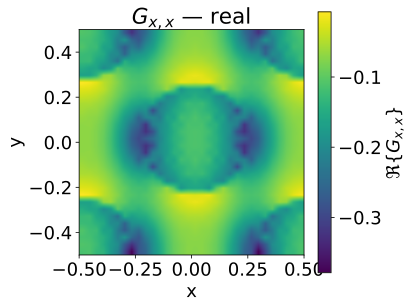

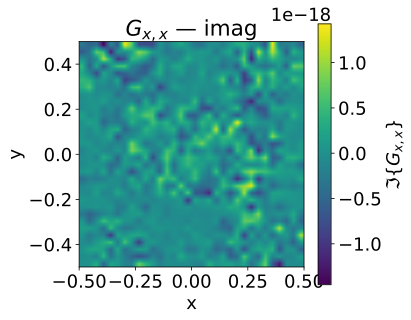

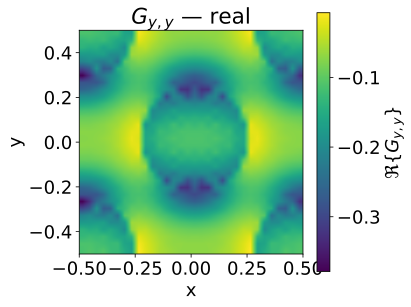

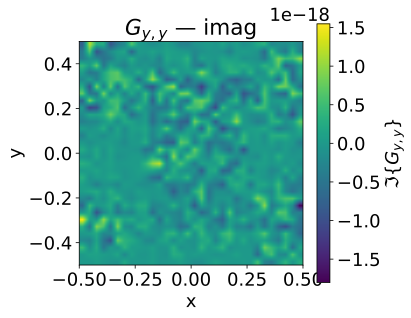

In [99]:

def compute_green_tensor(u0, df, simulation,  gamma=np.finfo(np.float64).tiny, polarization="te"):
    """
    Compute the MPB-normalized Green's tensor G_{ij}(r; u0) 
    on the simulation grid. Returns an array of shape (3,3,Nx,Ny,Nz).
    """
    k_indices = df["k index"].unique()
    Nk = len(k_indices)

    # Load one field to get the grid shape
    first_k = k_indices[0]
    first_band_col = next(col for col in df.columns if col.startswith(f"{polarization} band".strip()))
    first_band = int(first_band_col.split()[-1])
    if polarization == "":
        fname0 = f"{name}-e.k{first_k:02d}.b{first_band:02d}.h5"
    else:
        fname0 = f"{name}-e.k{first_k:02d}.b{first_band:02d}.{polarization}.h5"
    E0 = simulation.load_h5_data(os.path.join(simulation.directory, fname0))
    # build a (3, Nx, Ny, Nz) array for dimensions
    Ex0 = E0["x.r"] + 1j*E0["x.i"]
    Ey0 = E0["y.r"] + 1j*E0["y.i"]
    Ez0 = E0["z.r"] + 1j*E0["z.i"]
    grid_shape = Ex0.shape  # e.g. (Nx, Ny, Nz)


    # Initialize G tensor: 3×3 at every grid point
    G = np.zeros((3, 3) + grid_shape, dtype=complex)

    prefactor = 1.0 / (4 * np.pi**2 * Nk)

    for k_idx in k_indices:
        for col in df.columns:
            if not col.startswith(f"{polarization} band".strip()):
                continue
            u_n = df.loc[df["k index"] == k_idx, col].item()
            band_idx = int(col.split()[-1])
            if polarization == "":
                fname = f"{name}-e.k{k_idx:02d}.b{band_idx:02d}.h5"
            else:
                fname = f"{name}-e.k{k_idx:02d}.b{band_idx:02d}.te.h5"
            Edata = simulation.load_h5_data(os.path.join(simulation.directory, fname))
            Ex = Edata["x.r"] + 1j*Edata["x.i"]
            Ey = Edata["y.r"] + 1j*Edata["y.i"]
            Ez = Edata["z.r"] + 1j*Edata["z.i"]
                  
            # print("Ex shape: ", Ex.shape, " Ey shape: ", Ey.shape, " Ez shape: ", Ez.shape)
            # stack into shape (3, Nx, Ny, Nz)
            E_vec = np.stack((Ex, Ey, Ez), axis=0)

            # denominator at this band/k-point
            denom = (u0**2 - u_n**2) + 1j*gamma

            # dyadic product at each point: broadcast E_vec[:,None,...]*E_vec[None,...].conj()
            # This gives an array shape (3,3,Nx,Ny,Nz)
            dyad = E_vec[:, None, ...] * np.conj(E_vec[None, :, ...])

            # accumulate into G
            G += prefactor * dyad / denom

    return G



def plot_G_component_xy(G, x, y, component=(0,0), cmap='viridis',
                               plot_type='real', interpolation='bilinear'):
    """
    Plot the G_ij component of the Green's tensor over the x–y plane at fixed z,
    using imshow with interpolation for a smoother appearance.
    """
    i, j = component
    data = G[i, j, :, :]
    
    if plot_type == 'real':
        data_to_plot = np.real(data)
        label = f'$\\Re\\{{G_{{{["x","y","z"][i]},{["x","y","z"][j]}}}\\}}$'
    elif plot_type == 'imag':
        data_to_plot = np.imag(data)
        label = f'$\\Im\\{{G_{{{["x","y","z"][i]},{["x","y","z"][j]}}}\\}}$'
    else:
        data_to_plot = np.abs(data)
        label = f'$|G_{{{["x","y","z"][i]},{["x","y","z"][j]}}}|$'
    
    # Set up extent so imshow maps pixels to your physical x/y coordinates
    extent = (x.min(), x.max(), y.min(), y.max())
    
    fig, ax = plt.subplots(figsize=(6,5))
    im = ax.imshow(data_to_plot.T,        # note the transpose
                   origin='lower',
                   extent=extent,
                   interpolation=interpolation,
                   aspect='equal',
                   cmap=cmap)
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_title(f'$G_{{{["x","y","z"][i]}, {["x","y","z"][j]}}}$ — {plot_type}')
    cbar = fig.colorbar(im, ax=ax)
    cbar.set_label(label)
    plt.tight_layout()
    return fig, ax

G = compute_green_tensor(0.3, df, simulation, polarization="")
Nx, Ny = G.shape[2:] 
x = np.linspace(-0.5, 0.5, Nx)
y = np.linspace(-0.5, 0.5, Ny)

fig, ax = plot_G_component_xy(G, x, y, component=(0,0), cmap='viridis', plot_type='real')
plt.show()
fig, ax = plot_G_component_xy(G, x, y, component=(0,0), cmap='viridis', plot_type='imag')
plt.show()
fig, ax = plot_G_component_xy(G, x, y, component=(1,1), cmap='viridis', plot_type='real')
plt.show()
fig, ax = plot_G_component_xy(G, x, y, component=(1,1), cmap='viridis', plot_type='imag')
plt.show()

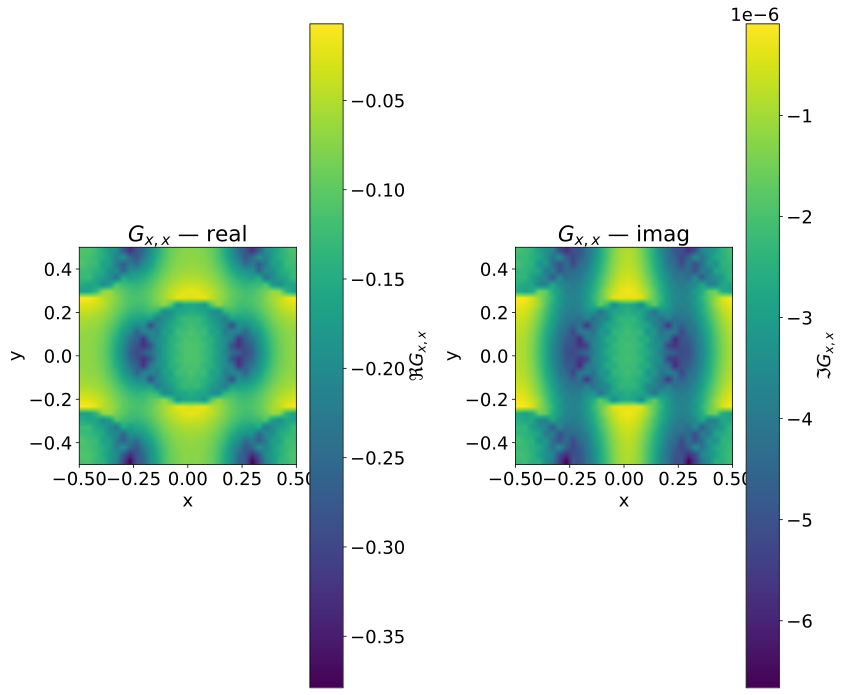

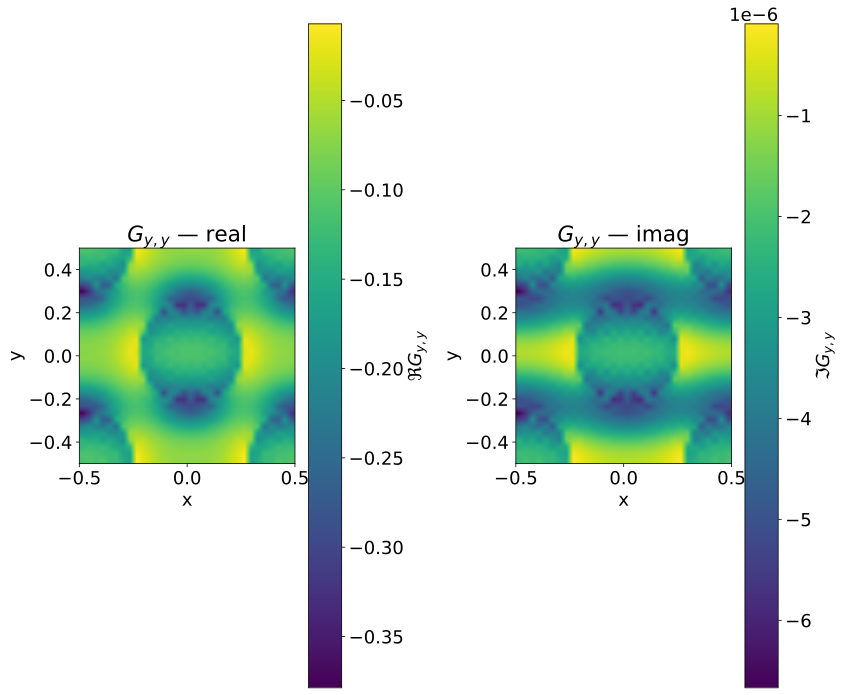

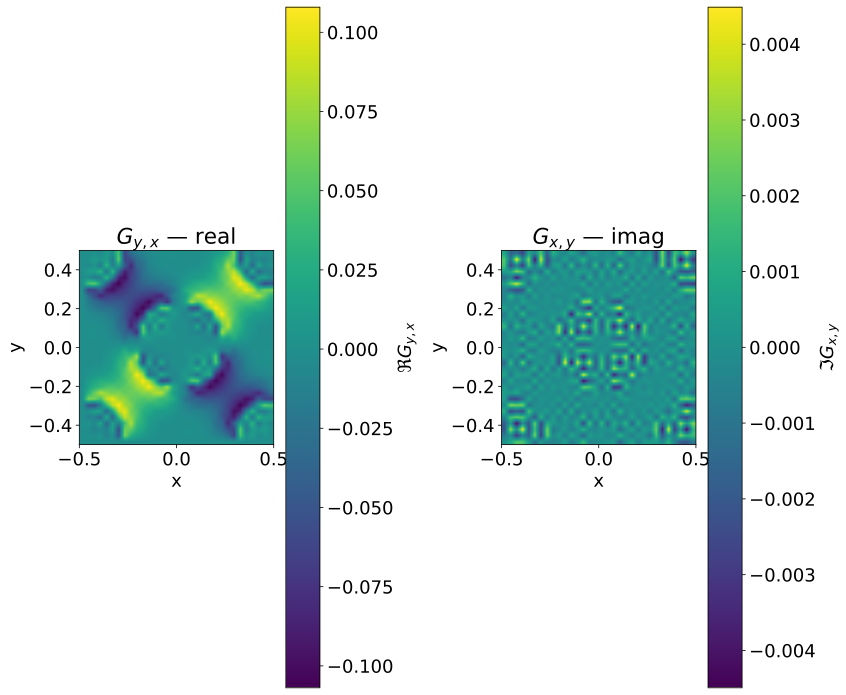

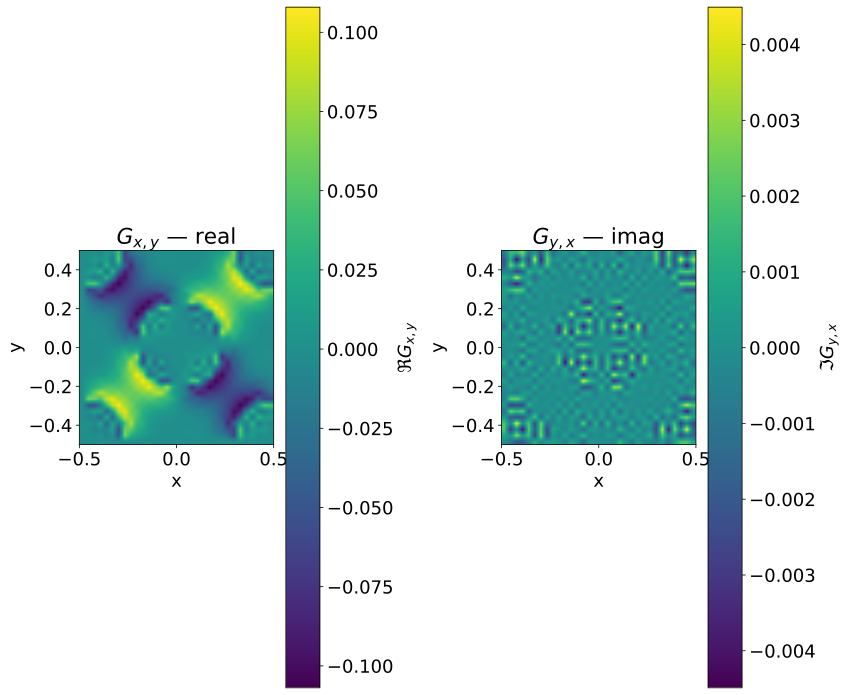

In [116]:
import os
import numpy as np
from concurrent.futures import ThreadPoolExecutor
import matplotlib.pyplot as plt


def compute_green_tensor(name, u0, df, simulation, 
                         gamma=1e-3, polarization="te", max_workers=8):
    """
    Compute the MPB-normalized Green's tensor G_{ij}(r; u0) 
    on the 2D simulation grid using multithreading for I/O.

    Parameters:
        name (str): base filename for HDF5 files (without extension)
        u0 (float): target frequency
        df (pd.DataFrame): DataFrame with columns ['k index', '<pol> band n']
        simulation: simulation object with attributes `directory` and method
                    `load_h5_data(fullpath)` returning dict of fields
        gamma (float): damping parameter to regularize denominator
        polarization (str): polarization tag for filenames ("te", "tm", or "")
        max_workers (int): number of threads for parallel file I/O

    Returns:
        G (np.ndarray): complex array of shape (3, 3, Nx, Ny)
    """
    # Unique k-point indices and number
    k_indices = df["k index"].unique()
    Nk = len(k_indices)

    # Helper to load and stack field data for a given (k_idx, band_idx)
    def load_fields(k_idx, band_idx):
        # construct filename
        tag = polarization if polarization else ""
        ext = f".{tag}.h5" if tag else ".h5"
        fname = f"{name}-e.k{k_idx:02d}.b{band_idx:02d}{ext}"
        fullpath = os.path.join(simulation.directory, fname)
        data = simulation.load_h5_data(fullpath)
        # complex field components
        Ex = data["x.r"] + 1j * data["x.i"]
        Ey = data["y.r"] + 1j * data["y.i"]
        Ez = data["z.r"] + 1j * data["z.i"]
        return np.stack((Ex, Ey, Ez), axis=0)

    # Load first field to get grid shape
    first_k = k_indices[0]
    band_cols = [col for col in df.columns if col.startswith(f"{polarization} band".strip())]
    first_band = int(band_cols[0].split()[-1])
    E0 = load_fields(first_k, first_band)
    # Grid shape: (3, Nx, Ny)
    _, Nx, Ny = E0.shape

    # Initialize Green's tensor
    G = np.zeros((3, 3, Nx, Ny), dtype=complex)
    prefactor = 1.0 / (4 * np.pi**2 * Nk)

    # Prepare tasks list
    tasks = []
    for k_idx in k_indices:
        for col in band_cols:
            band_idx = int(col.split()[-1])
            tasks.append((k_idx, band_idx, df.loc[df["k index"] == k_idx, col].item()))

    # Worker function: load fields, compute dyad, apply prefactor/denom
    def worker(args):
        k_idx, band_idx, u_n = args
        E_vec = load_fields(k_idx, band_idx)  # shape (3,Nx,Ny)
        # dyadic product: (3,3,Nx,Ny)
        dyad = E_vec[:, None, ...] * np.conj(E_vec[None, :, ...])
        denom = (u0**2 - u_n**2) + 1j * gamma
        return prefactor * dyad / denom

    # Parallel accumulation
    with ThreadPoolExecutor(max_workers=max_workers) as executor:
        for dyad_contrib in executor.map(worker, tasks, chunksize= len(tasks)//max_workers or 1):
            G += dyad_contrib

    return G


def plot_G_component_xy(G, x, y, component=(0,0), cmap='viridis',
                        plot_type='real', interpolation='bilinear', ax=None):
    """
    Plot the G_ij component of the Green's tensor over the x–y plane.
    """
    i, j = component
    data = G[i, j, :, :]
    if plot_type == 'real':
        data_to_plot = np.real(data)
        label = f'$\\Re{{G_{{{["x","y","z"][i]},{["x","y","z"][j]}}}}}$'
    elif plot_type == 'imag':
        data_to_plot = np.imag(data)
        label = f'$\\Im{{G_{{{["x","y","z"][i]},{["x","y","z"][j]}}}}}$'
    else:
        data_to_plot = np.abs(data)
        label = f'$|G_{{{["x","y","z"][i]},{["x","y","z"][j]}}}|$'

    extent = (x.min(), x.max(), y.min(), y.max())
    if ax is None:
        fig, ax = plt.subplots(figsize=(6, 5))
    im = ax.imshow(data_to_plot.T, origin='lower', extent=extent,
                   interpolation=interpolation, aspect='equal', cmap=cmap)
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_title(f'$G_{{{["x","y","z"][i]}, {["x","y","z"][j]}}}$ — {plot_type}')
    fig = ax.get_figure()
    cbar = fig.colorbar(im, ax=ax)
    cbar.set_label(label)
    plt.tight_layout()
    return fig, ax


# Example usage (2D):
G = compute_green_tensor(name, 0.3, df, simulation, gamma=1e-6, polarization='', max_workers=8)
Nx, Ny = G.shape[2:]
x = np.linspace(-0.5, 0.5, Nx)
y = np.linspace(-0.5, 0.5, Ny)

fig, axs = plt.subplots(1, 2, figsize=(12, 10))
plot_G_component_xy(G, x, y, component=(0,0), plot_type='real', ax=axs[0])
plot_G_component_xy(G, x, y, component=(0,0), plot_type='imag', ax=axs[1])
plt.show()


fig, axs = plt.subplots(1, 2, figsize=(12, 10))
plot_G_component_xy(G, x, y, component=(1,1), plot_type='real', ax=axs[0])
plot_G_component_xy(G, x, y, component=(1,1), plot_type='imag', ax=axs[1])
plt.show()

fix, axs = plt.subplots(1, 2, figsize=(12, 10))
plot_G_component_xy(G, x, y, component=(1,0), plot_type='real', ax=axs[0])
plot_G_component_xy(G, x, y, component=(0,1), plot_type='imag', ax=axs[1])
plt.show()


fix, axs = plt.subplots(1, 2, figsize=(12, 10))
plot_G_component_xy(G, x, y, component=(0,1), plot_type='real', ax=axs[0])
plot_G_component_xy(G, x, y, component=(1,0), plot_type='imag', ax=axs[1])
plt.show()


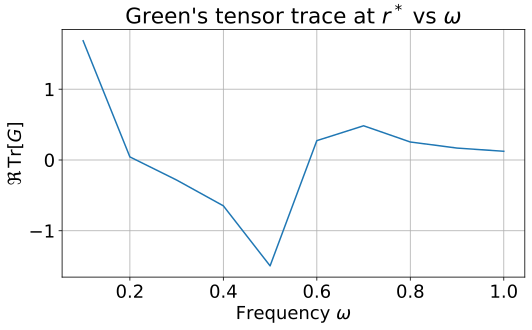

In [121]:
import os
import numpy as np
from concurrent.futures import ThreadPoolExecutor
import matplotlib.pyplot as plt


def compute_green_tensor(name, u0, df, simulation, 
                         gamma=1e-3, polarization="te", max_workers=8):
    """
    Compute the MPB-normalized Green's tensor G_{ij}(r; u0) 
    on the 2D simulation grid using multithreading for I/O.

    Parameters:
        name (str): base filename for HDF5 files (without extension)
        u0 (float): target frequency
        df (pd.DataFrame): DataFrame with columns ['k index', '<pol> band n']
        simulation: simulation object with attributes `directory` and method
                    `load_h5_data(fullpath)` returning dict of fields
        gamma (float): damping parameter to regularize denominator
        polarization (str): polarization tag for filenames ("te", "tm", or "")
        max_workers (int): number of threads for parallel file I/O

    Returns:
        G (np.ndarray): complex array of shape (3, 3, Nx, Ny)
    """
    # Unique k-point indices and number
    k_indices = df["k index"].unique()
    Nk = len(k_indices)

    # Helper to load and stack field data for a given (k_idx, band_idx)
    def load_fields(k_idx, band_idx):
        tag = polarization if polarization else ""
        ext = f".{tag}.h5" if tag else ".h5"
        fname = f"{name}-e.k{k_idx:02d}.b{band_idx:02d}{ext}"
        fullpath = os.path.join(simulation.directory, fname)
        data = simulation.load_h5_data(fullpath)
        Ex = data["x.r"] + 1j * data["x.i"]
        Ey = data["y.r"] + 1j * data["y.i"]
        Ez = data["z.r"] + 1j * data["z.i"]
        return np.stack((Ex, Ey, Ez), axis=0)

    # Load first field to get grid shape
    first_k = k_indices[0]
    band_cols = [col for col in df.columns if col.startswith(f"{polarization} band".strip())]
    first_band = int(band_cols[0].split()[-1])
    E0 = load_fields(first_k, first_band)
    _, Nx, Ny = E0.shape

    G = np.zeros((3, 3, Nx, Ny), dtype=complex)
    prefactor = 1.0 / (4 * np.pi**2 * Nk)

    tasks = [(k_idx, int(col.split()[-1]), df.loc[df["k index"]==k_idx, col].item())
             for k_idx in k_indices for col in band_cols]

    def worker(args):
        k_idx, band_idx, u_n = args
        E_vec = load_fields(k_idx, band_idx)
        dyad = E_vec[:, None, ...] * np.conj(E_vec[None, :, ...])
        denom = (u0**2 - u_n**2) + 1j * gamma
        return prefactor * dyad / denom

    with ThreadPoolExecutor(max_workers=max_workers) as executor:
        for contrib in executor.map(worker, tasks, chunksize=len(tasks)//max_workers or 1):
            G += contrib

    return G


def compute_green_vs_frequency(name, freq_list, df, simulation,
                               gamma=1e-3, polarization="te", max_workers=8,
                               r_idx=(None, None)):
    """
    Compute G(r*, r*; w) over a list of frequencies at a fixed grid point r*.

    Parameters:
        name (str): base filename for HDF5 files
        freq_list (array-like): frequencies to evaluate
        df (pd.DataFrame): frequency DataFrame
        simulation: simulation object
        gamma (float): damping
        polarization (str): mode tag
        max_workers (int): threads
        r_idx (tuple): (ix, iy) index of the spatial point r*

    Returns:
        w_array (np.ndarray), G_vec (np.ndarray): frequencies and trace G(r*,r*)
    """
    # Determine spatial index
    ix, iy = r_idx
    # Preallocate result array
    G_trace = np.zeros(len(freq_list), dtype=complex)

    for i, w in enumerate(freq_list):
        G = compute_green_tensor(name, w, df, simulation,
                                 gamma=gamma, polarization=polarization,
                                 max_workers=max_workers)
        # trace over i=j components
        G_trace[i] = np.trace(G[:, :, ix, iy])
    return np.array(freq_list), G_trace


def plot_G_vs_frequency(w_array, G_trace, plot_type='imag'):
    """
    Plot G(r*,r*; w) versus frequency w.

    plot_type: 'real', 'imag', or 'abs'
    """
    if plot_type == 'real':
        y = np.real(G_trace)
        label = '$\Re\,\mathrm{Tr}[G]$'
    elif plot_type == 'imag':
        y = np.imag(G_trace)
        label = '$\Im\,\mathrm{Tr}[G]$'
    else:
        y = np.abs(G_trace)
        label = '$|\mathrm{Tr}[G]|$'

    plt.figure(figsize=(8, 5))
    plt.plot(w_array, y)
    plt.xlabel('Frequency $\omega$')
    plt.ylabel(label)
    plt.title('Green\'s tensor trace at $r^*$ vs $\omega$')
    plt.grid(True)
    plt.tight_layout()
    return plt.gcf(), plt.gca()

#Example for G(r*,r*;w) plot:
freq_list = np.linspace(0.1, 1.0, 10)
r_idx = (Nx//2, Ny//2)
w, Gtr = compute_green_vs_frequency(name, freq_list, df, simulation,
                                     gamma=1e-6, polarization='',
                                     max_workers=8, r_idx=r_idx)
fig, ax = plot_G_vs_frequency(w, Gtr, plot_type='real')
plt.show()


Green's tensor vs frequency:   0%|          | 0/20 [00:00<?, ?it/s]

Tasks to compute: [(1, 1, 0.251981), (1, 2, 0.256235), (1, 3, 0.370834), (1, 4, 0.373507), (1, 5, 0.62487), (1, 6, 0.63199), (1, 7, 0.652494), (1, 8, 0.658641), (1, 9, 0.689179), (1, 10, 0.694796), (2, 1, 0.244104), (2, 2, 0.255842), (2, 3, 0.374538), (2, 4, 0.381723), (2, 5, 0.616221), (2, 6, 0.625655), (2, 7, 0.653814), (2, 8, 0.666271), (2, 9, 0.685407), (2, 10, 0.696362), (3, 1, 0.234296), (3, 2, 0.251753), (3, 3, 0.383681), (3, 4, 0.393693), (3, 5, 0.60469), (3, 6, 0.613835), (3, 7, 0.658686), (3, 8, 0.66855), (3, 9, 0.68648), (3, 10, 0.697025), (4, 1, 0.224237), (4, 2, 0.245789), (4, 3, 0.396247), (4, 4, 0.407665), (4, 5, 0.591598), (4, 6, 0.600147), (4, 7, 0.661787), (4, 8, 0.666024), (4, 9, 0.693953), (4, 10, 0.698059), (5, 1, 0.215188), (5, 2, 0.239642), (5, 3, 0.410122), (5, 4, 0.422088), (5, 5, 0.577944), (5, 6, 0.586128), (5, 7, 0.658864), (5, 8, 0.66704), (5, 9, 0.700573), (5, 10, 0.703126), (6, 1, 0.208064), (6, 2, 0.234506), (6, 3, 0.423202), (6, 4, 0.435292), (6, 5, 0.5

Green's tensor vs frequency:   5%|▌         | 1/20 [00:08<02:47,  8.79s/it]

Tasks to compute: [(1, 1, 0.251981), (1, 2, 0.256235), (1, 3, 0.370834), (1, 4, 0.373507), (1, 5, 0.62487), (1, 6, 0.63199), (1, 7, 0.652494), (1, 8, 0.658641), (1, 9, 0.689179), (1, 10, 0.694796), (2, 1, 0.244104), (2, 2, 0.255842), (2, 3, 0.374538), (2, 4, 0.381723), (2, 5, 0.616221), (2, 6, 0.625655), (2, 7, 0.653814), (2, 8, 0.666271), (2, 9, 0.685407), (2, 10, 0.696362), (3, 1, 0.234296), (3, 2, 0.251753), (3, 3, 0.383681), (3, 4, 0.393693), (3, 5, 0.60469), (3, 6, 0.613835), (3, 7, 0.658686), (3, 8, 0.66855), (3, 9, 0.68648), (3, 10, 0.697025), (4, 1, 0.224237), (4, 2, 0.245789), (4, 3, 0.396247), (4, 4, 0.407665), (4, 5, 0.591598), (4, 6, 0.600147), (4, 7, 0.661787), (4, 8, 0.666024), (4, 9, 0.693953), (4, 10, 0.698059), (5, 1, 0.215188), (5, 2, 0.239642), (5, 3, 0.410122), (5, 4, 0.422088), (5, 5, 0.577944), (5, 6, 0.586128), (5, 7, 0.658864), (5, 8, 0.66704), (5, 9, 0.700573), (5, 10, 0.703126), (6, 1, 0.208064), (6, 2, 0.234506), (6, 3, 0.423202), (6, 4, 0.435292), (6, 5, 0.5

Green's tensor vs frequency:  10%|█         | 2/20 [00:17<02:40,  8.92s/it]

Tasks to compute: [(1, 1, 0.251981), (1, 2, 0.256235), (1, 3, 0.370834), (1, 4, 0.373507), (1, 5, 0.62487), (1, 6, 0.63199), (1, 7, 0.652494), (1, 8, 0.658641), (1, 9, 0.689179), (1, 10, 0.694796), (2, 1, 0.244104), (2, 2, 0.255842), (2, 3, 0.374538), (2, 4, 0.381723), (2, 5, 0.616221), (2, 6, 0.625655), (2, 7, 0.653814), (2, 8, 0.666271), (2, 9, 0.685407), (2, 10, 0.696362), (3, 1, 0.234296), (3, 2, 0.251753), (3, 3, 0.383681), (3, 4, 0.393693), (3, 5, 0.60469), (3, 6, 0.613835), (3, 7, 0.658686), (3, 8, 0.66855), (3, 9, 0.68648), (3, 10, 0.697025), (4, 1, 0.224237), (4, 2, 0.245789), (4, 3, 0.396247), (4, 4, 0.407665), (4, 5, 0.591598), (4, 6, 0.600147), (4, 7, 0.661787), (4, 8, 0.666024), (4, 9, 0.693953), (4, 10, 0.698059), (5, 1, 0.215188), (5, 2, 0.239642), (5, 3, 0.410122), (5, 4, 0.422088), (5, 5, 0.577944), (5, 6, 0.586128), (5, 7, 0.658864), (5, 8, 0.66704), (5, 9, 0.700573), (5, 10, 0.703126), (6, 1, 0.208064), (6, 2, 0.234506), (6, 3, 0.423202), (6, 4, 0.435292), (6, 5, 0.5

Green's tensor vs frequency:  15%|█▌        | 3/20 [00:26<02:31,  8.89s/it]

Tasks to compute: [(1, 1, 0.251981), (1, 2, 0.256235), (1, 3, 0.370834), (1, 4, 0.373507), (1, 5, 0.62487), (1, 6, 0.63199), (1, 7, 0.652494), (1, 8, 0.658641), (1, 9, 0.689179), (1, 10, 0.694796), (2, 1, 0.244104), (2, 2, 0.255842), (2, 3, 0.374538), (2, 4, 0.381723), (2, 5, 0.616221), (2, 6, 0.625655), (2, 7, 0.653814), (2, 8, 0.666271), (2, 9, 0.685407), (2, 10, 0.696362), (3, 1, 0.234296), (3, 2, 0.251753), (3, 3, 0.383681), (3, 4, 0.393693), (3, 5, 0.60469), (3, 6, 0.613835), (3, 7, 0.658686), (3, 8, 0.66855), (3, 9, 0.68648), (3, 10, 0.697025), (4, 1, 0.224237), (4, 2, 0.245789), (4, 3, 0.396247), (4, 4, 0.407665), (4, 5, 0.591598), (4, 6, 0.600147), (4, 7, 0.661787), (4, 8, 0.666024), (4, 9, 0.693953), (4, 10, 0.698059), (5, 1, 0.215188), (5, 2, 0.239642), (5, 3, 0.410122), (5, 4, 0.422088), (5, 5, 0.577944), (5, 6, 0.586128), (5, 7, 0.658864), (5, 8, 0.66704), (5, 9, 0.700573), (5, 10, 0.703126), (6, 1, 0.208064), (6, 2, 0.234506), (6, 3, 0.423202), (6, 4, 0.435292), (6, 5, 0.5

Green's tensor vs frequency:  20%|██        | 4/20 [00:35<02:21,  8.83s/it]

Tasks to compute: [(1, 1, 0.251981), (1, 2, 0.256235), (1, 3, 0.370834), (1, 4, 0.373507), (1, 5, 0.62487), (1, 6, 0.63199), (1, 7, 0.652494), (1, 8, 0.658641), (1, 9, 0.689179), (1, 10, 0.694796), (2, 1, 0.244104), (2, 2, 0.255842), (2, 3, 0.374538), (2, 4, 0.381723), (2, 5, 0.616221), (2, 6, 0.625655), (2, 7, 0.653814), (2, 8, 0.666271), (2, 9, 0.685407), (2, 10, 0.696362), (3, 1, 0.234296), (3, 2, 0.251753), (3, 3, 0.383681), (3, 4, 0.393693), (3, 5, 0.60469), (3, 6, 0.613835), (3, 7, 0.658686), (3, 8, 0.66855), (3, 9, 0.68648), (3, 10, 0.697025), (4, 1, 0.224237), (4, 2, 0.245789), (4, 3, 0.396247), (4, 4, 0.407665), (4, 5, 0.591598), (4, 6, 0.600147), (4, 7, 0.661787), (4, 8, 0.666024), (4, 9, 0.693953), (4, 10, 0.698059), (5, 1, 0.215188), (5, 2, 0.239642), (5, 3, 0.410122), (5, 4, 0.422088), (5, 5, 0.577944), (5, 6, 0.586128), (5, 7, 0.658864), (5, 8, 0.66704), (5, 9, 0.700573), (5, 10, 0.703126), (6, 1, 0.208064), (6, 2, 0.234506), (6, 3, 0.423202), (6, 4, 0.435292), (6, 5, 0.5

Green's tensor vs frequency:  25%|██▌       | 5/20 [00:44<02:13,  8.93s/it]

Tasks to compute: [(1, 1, 0.251981), (1, 2, 0.256235), (1, 3, 0.370834), (1, 4, 0.373507), (1, 5, 0.62487), (1, 6, 0.63199), (1, 7, 0.652494), (1, 8, 0.658641), (1, 9, 0.689179), (1, 10, 0.694796), (2, 1, 0.244104), (2, 2, 0.255842), (2, 3, 0.374538), (2, 4, 0.381723), (2, 5, 0.616221), (2, 6, 0.625655), (2, 7, 0.653814), (2, 8, 0.666271), (2, 9, 0.685407), (2, 10, 0.696362), (3, 1, 0.234296), (3, 2, 0.251753), (3, 3, 0.383681), (3, 4, 0.393693), (3, 5, 0.60469), (3, 6, 0.613835), (3, 7, 0.658686), (3, 8, 0.66855), (3, 9, 0.68648), (3, 10, 0.697025), (4, 1, 0.224237), (4, 2, 0.245789), (4, 3, 0.396247), (4, 4, 0.407665), (4, 5, 0.591598), (4, 6, 0.600147), (4, 7, 0.661787), (4, 8, 0.666024), (4, 9, 0.693953), (4, 10, 0.698059), (5, 1, 0.215188), (5, 2, 0.239642), (5, 3, 0.410122), (5, 4, 0.422088), (5, 5, 0.577944), (5, 6, 0.586128), (5, 7, 0.658864), (5, 8, 0.66704), (5, 9, 0.700573), (5, 10, 0.703126), (6, 1, 0.208064), (6, 2, 0.234506), (6, 3, 0.423202), (6, 4, 0.435292), (6, 5, 0.5

Green's tensor vs frequency:  30%|███       | 6/20 [00:53<02:04,  8.90s/it]

Tasks to compute: [(1, 1, 0.251981), (1, 2, 0.256235), (1, 3, 0.370834), (1, 4, 0.373507), (1, 5, 0.62487), (1, 6, 0.63199), (1, 7, 0.652494), (1, 8, 0.658641), (1, 9, 0.689179), (1, 10, 0.694796), (2, 1, 0.244104), (2, 2, 0.255842), (2, 3, 0.374538), (2, 4, 0.381723), (2, 5, 0.616221), (2, 6, 0.625655), (2, 7, 0.653814), (2, 8, 0.666271), (2, 9, 0.685407), (2, 10, 0.696362), (3, 1, 0.234296), (3, 2, 0.251753), (3, 3, 0.383681), (3, 4, 0.393693), (3, 5, 0.60469), (3, 6, 0.613835), (3, 7, 0.658686), (3, 8, 0.66855), (3, 9, 0.68648), (3, 10, 0.697025), (4, 1, 0.224237), (4, 2, 0.245789), (4, 3, 0.396247), (4, 4, 0.407665), (4, 5, 0.591598), (4, 6, 0.600147), (4, 7, 0.661787), (4, 8, 0.666024), (4, 9, 0.693953), (4, 10, 0.698059), (5, 1, 0.215188), (5, 2, 0.239642), (5, 3, 0.410122), (5, 4, 0.422088), (5, 5, 0.577944), (5, 6, 0.586128), (5, 7, 0.658864), (5, 8, 0.66704), (5, 9, 0.700573), (5, 10, 0.703126), (6, 1, 0.208064), (6, 2, 0.234506), (6, 3, 0.423202), (6, 4, 0.435292), (6, 5, 0.5

Green's tensor vs frequency:  35%|███▌      | 7/20 [01:02<01:54,  8.83s/it]

Tasks to compute: [(1, 1, 0.251981), (1, 2, 0.256235), (1, 3, 0.370834), (1, 4, 0.373507), (1, 5, 0.62487), (1, 6, 0.63199), (1, 7, 0.652494), (1, 8, 0.658641), (1, 9, 0.689179), (1, 10, 0.694796), (2, 1, 0.244104), (2, 2, 0.255842), (2, 3, 0.374538), (2, 4, 0.381723), (2, 5, 0.616221), (2, 6, 0.625655), (2, 7, 0.653814), (2, 8, 0.666271), (2, 9, 0.685407), (2, 10, 0.696362), (3, 1, 0.234296), (3, 2, 0.251753), (3, 3, 0.383681), (3, 4, 0.393693), (3, 5, 0.60469), (3, 6, 0.613835), (3, 7, 0.658686), (3, 8, 0.66855), (3, 9, 0.68648), (3, 10, 0.697025), (4, 1, 0.224237), (4, 2, 0.245789), (4, 3, 0.396247), (4, 4, 0.407665), (4, 5, 0.591598), (4, 6, 0.600147), (4, 7, 0.661787), (4, 8, 0.666024), (4, 9, 0.693953), (4, 10, 0.698059), (5, 1, 0.215188), (5, 2, 0.239642), (5, 3, 0.410122), (5, 4, 0.422088), (5, 5, 0.577944), (5, 6, 0.586128), (5, 7, 0.658864), (5, 8, 0.66704), (5, 9, 0.700573), (5, 10, 0.703126), (6, 1, 0.208064), (6, 2, 0.234506), (6, 3, 0.423202), (6, 4, 0.435292), (6, 5, 0.5

Green's tensor vs frequency:  40%|████      | 8/20 [01:11<01:47,  8.95s/it]

Tasks to compute: [(1, 1, 0.251981), (1, 2, 0.256235), (1, 3, 0.370834), (1, 4, 0.373507), (1, 5, 0.62487), (1, 6, 0.63199), (1, 7, 0.652494), (1, 8, 0.658641), (1, 9, 0.689179), (1, 10, 0.694796), (2, 1, 0.244104), (2, 2, 0.255842), (2, 3, 0.374538), (2, 4, 0.381723), (2, 5, 0.616221), (2, 6, 0.625655), (2, 7, 0.653814), (2, 8, 0.666271), (2, 9, 0.685407), (2, 10, 0.696362), (3, 1, 0.234296), (3, 2, 0.251753), (3, 3, 0.383681), (3, 4, 0.393693), (3, 5, 0.60469), (3, 6, 0.613835), (3, 7, 0.658686), (3, 8, 0.66855), (3, 9, 0.68648), (3, 10, 0.697025), (4, 1, 0.224237), (4, 2, 0.245789), (4, 3, 0.396247), (4, 4, 0.407665), (4, 5, 0.591598), (4, 6, 0.600147), (4, 7, 0.661787), (4, 8, 0.666024), (4, 9, 0.693953), (4, 10, 0.698059), (5, 1, 0.215188), (5, 2, 0.239642), (5, 3, 0.410122), (5, 4, 0.422088), (5, 5, 0.577944), (5, 6, 0.586128), (5, 7, 0.658864), (5, 8, 0.66704), (5, 9, 0.700573), (5, 10, 0.703126), (6, 1, 0.208064), (6, 2, 0.234506), (6, 3, 0.423202), (6, 4, 0.435292), (6, 5, 0.5

Green's tensor vs frequency:  45%|████▌     | 9/20 [01:19<01:37,  8.87s/it]

Tasks to compute: [(1, 1, 0.251981), (1, 2, 0.256235), (1, 3, 0.370834), (1, 4, 0.373507), (1, 5, 0.62487), (1, 6, 0.63199), (1, 7, 0.652494), (1, 8, 0.658641), (1, 9, 0.689179), (1, 10, 0.694796), (2, 1, 0.244104), (2, 2, 0.255842), (2, 3, 0.374538), (2, 4, 0.381723), (2, 5, 0.616221), (2, 6, 0.625655), (2, 7, 0.653814), (2, 8, 0.666271), (2, 9, 0.685407), (2, 10, 0.696362), (3, 1, 0.234296), (3, 2, 0.251753), (3, 3, 0.383681), (3, 4, 0.393693), (3, 5, 0.60469), (3, 6, 0.613835), (3, 7, 0.658686), (3, 8, 0.66855), (3, 9, 0.68648), (3, 10, 0.697025), (4, 1, 0.224237), (4, 2, 0.245789), (4, 3, 0.396247), (4, 4, 0.407665), (4, 5, 0.591598), (4, 6, 0.600147), (4, 7, 0.661787), (4, 8, 0.666024), (4, 9, 0.693953), (4, 10, 0.698059), (5, 1, 0.215188), (5, 2, 0.239642), (5, 3, 0.410122), (5, 4, 0.422088), (5, 5, 0.577944), (5, 6, 0.586128), (5, 7, 0.658864), (5, 8, 0.66704), (5, 9, 0.700573), (5, 10, 0.703126), (6, 1, 0.208064), (6, 2, 0.234506), (6, 3, 0.423202), (6, 4, 0.435292), (6, 5, 0.5

Green's tensor vs frequency:  50%|█████     | 10/20 [01:28<01:28,  8.82s/it]

Tasks to compute: [(1, 1, 0.251981), (1, 2, 0.256235), (1, 3, 0.370834), (1, 4, 0.373507), (1, 5, 0.62487), (1, 6, 0.63199), (1, 7, 0.652494), (1, 8, 0.658641), (1, 9, 0.689179), (1, 10, 0.694796), (2, 1, 0.244104), (2, 2, 0.255842), (2, 3, 0.374538), (2, 4, 0.381723), (2, 5, 0.616221), (2, 6, 0.625655), (2, 7, 0.653814), (2, 8, 0.666271), (2, 9, 0.685407), (2, 10, 0.696362), (3, 1, 0.234296), (3, 2, 0.251753), (3, 3, 0.383681), (3, 4, 0.393693), (3, 5, 0.60469), (3, 6, 0.613835), (3, 7, 0.658686), (3, 8, 0.66855), (3, 9, 0.68648), (3, 10, 0.697025), (4, 1, 0.224237), (4, 2, 0.245789), (4, 3, 0.396247), (4, 4, 0.407665), (4, 5, 0.591598), (4, 6, 0.600147), (4, 7, 0.661787), (4, 8, 0.666024), (4, 9, 0.693953), (4, 10, 0.698059), (5, 1, 0.215188), (5, 2, 0.239642), (5, 3, 0.410122), (5, 4, 0.422088), (5, 5, 0.577944), (5, 6, 0.586128), (5, 7, 0.658864), (5, 8, 0.66704), (5, 9, 0.700573), (5, 10, 0.703126), (6, 1, 0.208064), (6, 2, 0.234506), (6, 3, 0.423202), (6, 4, 0.435292), (6, 5, 0.5

Green's tensor vs frequency:  55%|█████▌    | 11/20 [01:37<01:20,  8.97s/it]

Tasks to compute: [(1, 1, 0.251981), (1, 2, 0.256235), (1, 3, 0.370834), (1, 4, 0.373507), (1, 5, 0.62487), (1, 6, 0.63199), (1, 7, 0.652494), (1, 8, 0.658641), (1, 9, 0.689179), (1, 10, 0.694796), (2, 1, 0.244104), (2, 2, 0.255842), (2, 3, 0.374538), (2, 4, 0.381723), (2, 5, 0.616221), (2, 6, 0.625655), (2, 7, 0.653814), (2, 8, 0.666271), (2, 9, 0.685407), (2, 10, 0.696362), (3, 1, 0.234296), (3, 2, 0.251753), (3, 3, 0.383681), (3, 4, 0.393693), (3, 5, 0.60469), (3, 6, 0.613835), (3, 7, 0.658686), (3, 8, 0.66855), (3, 9, 0.68648), (3, 10, 0.697025), (4, 1, 0.224237), (4, 2, 0.245789), (4, 3, 0.396247), (4, 4, 0.407665), (4, 5, 0.591598), (4, 6, 0.600147), (4, 7, 0.661787), (4, 8, 0.666024), (4, 9, 0.693953), (4, 10, 0.698059), (5, 1, 0.215188), (5, 2, 0.239642), (5, 3, 0.410122), (5, 4, 0.422088), (5, 5, 0.577944), (5, 6, 0.586128), (5, 7, 0.658864), (5, 8, 0.66704), (5, 9, 0.700573), (5, 10, 0.703126), (6, 1, 0.208064), (6, 2, 0.234506), (6, 3, 0.423202), (6, 4, 0.435292), (6, 5, 0.5

Green's tensor vs frequency:  60%|██████    | 12/20 [01:46<01:11,  8.99s/it]

Tasks to compute: [(1, 1, 0.251981), (1, 2, 0.256235), (1, 3, 0.370834), (1, 4, 0.373507), (1, 5, 0.62487), (1, 6, 0.63199), (1, 7, 0.652494), (1, 8, 0.658641), (1, 9, 0.689179), (1, 10, 0.694796), (2, 1, 0.244104), (2, 2, 0.255842), (2, 3, 0.374538), (2, 4, 0.381723), (2, 5, 0.616221), (2, 6, 0.625655), (2, 7, 0.653814), (2, 8, 0.666271), (2, 9, 0.685407), (2, 10, 0.696362), (3, 1, 0.234296), (3, 2, 0.251753), (3, 3, 0.383681), (3, 4, 0.393693), (3, 5, 0.60469), (3, 6, 0.613835), (3, 7, 0.658686), (3, 8, 0.66855), (3, 9, 0.68648), (3, 10, 0.697025), (4, 1, 0.224237), (4, 2, 0.245789), (4, 3, 0.396247), (4, 4, 0.407665), (4, 5, 0.591598), (4, 6, 0.600147), (4, 7, 0.661787), (4, 8, 0.666024), (4, 9, 0.693953), (4, 10, 0.698059), (5, 1, 0.215188), (5, 2, 0.239642), (5, 3, 0.410122), (5, 4, 0.422088), (5, 5, 0.577944), (5, 6, 0.586128), (5, 7, 0.658864), (5, 8, 0.66704), (5, 9, 0.700573), (5, 10, 0.703126), (6, 1, 0.208064), (6, 2, 0.234506), (6, 3, 0.423202), (6, 4, 0.435292), (6, 5, 0.5

Green's tensor vs frequency:  65%|██████▌   | 13/20 [01:55<01:02,  8.94s/it]

Tasks to compute: [(1, 1, 0.251981), (1, 2, 0.256235), (1, 3, 0.370834), (1, 4, 0.373507), (1, 5, 0.62487), (1, 6, 0.63199), (1, 7, 0.652494), (1, 8, 0.658641), (1, 9, 0.689179), (1, 10, 0.694796), (2, 1, 0.244104), (2, 2, 0.255842), (2, 3, 0.374538), (2, 4, 0.381723), (2, 5, 0.616221), (2, 6, 0.625655), (2, 7, 0.653814), (2, 8, 0.666271), (2, 9, 0.685407), (2, 10, 0.696362), (3, 1, 0.234296), (3, 2, 0.251753), (3, 3, 0.383681), (3, 4, 0.393693), (3, 5, 0.60469), (3, 6, 0.613835), (3, 7, 0.658686), (3, 8, 0.66855), (3, 9, 0.68648), (3, 10, 0.697025), (4, 1, 0.224237), (4, 2, 0.245789), (4, 3, 0.396247), (4, 4, 0.407665), (4, 5, 0.591598), (4, 6, 0.600147), (4, 7, 0.661787), (4, 8, 0.666024), (4, 9, 0.693953), (4, 10, 0.698059), (5, 1, 0.215188), (5, 2, 0.239642), (5, 3, 0.410122), (5, 4, 0.422088), (5, 5, 0.577944), (5, 6, 0.586128), (5, 7, 0.658864), (5, 8, 0.66704), (5, 9, 0.700573), (5, 10, 0.703126), (6, 1, 0.208064), (6, 2, 0.234506), (6, 3, 0.423202), (6, 4, 0.435292), (6, 5, 0.5

Green's tensor vs frequency:  70%|███████   | 14/20 [02:04<00:53,  8.93s/it]

Tasks to compute: [(1, 1, 0.251981), (1, 2, 0.256235), (1, 3, 0.370834), (1, 4, 0.373507), (1, 5, 0.62487), (1, 6, 0.63199), (1, 7, 0.652494), (1, 8, 0.658641), (1, 9, 0.689179), (1, 10, 0.694796), (2, 1, 0.244104), (2, 2, 0.255842), (2, 3, 0.374538), (2, 4, 0.381723), (2, 5, 0.616221), (2, 6, 0.625655), (2, 7, 0.653814), (2, 8, 0.666271), (2, 9, 0.685407), (2, 10, 0.696362), (3, 1, 0.234296), (3, 2, 0.251753), (3, 3, 0.383681), (3, 4, 0.393693), (3, 5, 0.60469), (3, 6, 0.613835), (3, 7, 0.658686), (3, 8, 0.66855), (3, 9, 0.68648), (3, 10, 0.697025), (4, 1, 0.224237), (4, 2, 0.245789), (4, 3, 0.396247), (4, 4, 0.407665), (4, 5, 0.591598), (4, 6, 0.600147), (4, 7, 0.661787), (4, 8, 0.666024), (4, 9, 0.693953), (4, 10, 0.698059), (5, 1, 0.215188), (5, 2, 0.239642), (5, 3, 0.410122), (5, 4, 0.422088), (5, 5, 0.577944), (5, 6, 0.586128), (5, 7, 0.658864), (5, 8, 0.66704), (5, 9, 0.700573), (5, 10, 0.703126), (6, 1, 0.208064), (6, 2, 0.234506), (6, 3, 0.423202), (6, 4, 0.435292), (6, 5, 0.5

Green's tensor vs frequency:  75%|███████▌  | 15/20 [02:14<00:45,  9.06s/it]

Tasks to compute: [(1, 1, 0.251981), (1, 2, 0.256235), (1, 3, 0.370834), (1, 4, 0.373507), (1, 5, 0.62487), (1, 6, 0.63199), (1, 7, 0.652494), (1, 8, 0.658641), (1, 9, 0.689179), (1, 10, 0.694796), (2, 1, 0.244104), (2, 2, 0.255842), (2, 3, 0.374538), (2, 4, 0.381723), (2, 5, 0.616221), (2, 6, 0.625655), (2, 7, 0.653814), (2, 8, 0.666271), (2, 9, 0.685407), (2, 10, 0.696362), (3, 1, 0.234296), (3, 2, 0.251753), (3, 3, 0.383681), (3, 4, 0.393693), (3, 5, 0.60469), (3, 6, 0.613835), (3, 7, 0.658686), (3, 8, 0.66855), (3, 9, 0.68648), (3, 10, 0.697025), (4, 1, 0.224237), (4, 2, 0.245789), (4, 3, 0.396247), (4, 4, 0.407665), (4, 5, 0.591598), (4, 6, 0.600147), (4, 7, 0.661787), (4, 8, 0.666024), (4, 9, 0.693953), (4, 10, 0.698059), (5, 1, 0.215188), (5, 2, 0.239642), (5, 3, 0.410122), (5, 4, 0.422088), (5, 5, 0.577944), (5, 6, 0.586128), (5, 7, 0.658864), (5, 8, 0.66704), (5, 9, 0.700573), (5, 10, 0.703126), (6, 1, 0.208064), (6, 2, 0.234506), (6, 3, 0.423202), (6, 4, 0.435292), (6, 5, 0.5

Green's tensor vs frequency:  80%|████████  | 16/20 [02:22<00:36,  9.02s/it]

Tasks to compute: [(1, 1, 0.251981), (1, 2, 0.256235), (1, 3, 0.370834), (1, 4, 0.373507), (1, 5, 0.62487), (1, 6, 0.63199), (1, 7, 0.652494), (1, 8, 0.658641), (1, 9, 0.689179), (1, 10, 0.694796), (2, 1, 0.244104), (2, 2, 0.255842), (2, 3, 0.374538), (2, 4, 0.381723), (2, 5, 0.616221), (2, 6, 0.625655), (2, 7, 0.653814), (2, 8, 0.666271), (2, 9, 0.685407), (2, 10, 0.696362), (3, 1, 0.234296), (3, 2, 0.251753), (3, 3, 0.383681), (3, 4, 0.393693), (3, 5, 0.60469), (3, 6, 0.613835), (3, 7, 0.658686), (3, 8, 0.66855), (3, 9, 0.68648), (3, 10, 0.697025), (4, 1, 0.224237), (4, 2, 0.245789), (4, 3, 0.396247), (4, 4, 0.407665), (4, 5, 0.591598), (4, 6, 0.600147), (4, 7, 0.661787), (4, 8, 0.666024), (4, 9, 0.693953), (4, 10, 0.698059), (5, 1, 0.215188), (5, 2, 0.239642), (5, 3, 0.410122), (5, 4, 0.422088), (5, 5, 0.577944), (5, 6, 0.586128), (5, 7, 0.658864), (5, 8, 0.66704), (5, 9, 0.700573), (5, 10, 0.703126), (6, 1, 0.208064), (6, 2, 0.234506), (6, 3, 0.423202), (6, 4, 0.435292), (6, 5, 0.5

Green's tensor vs frequency:  85%|████████▌ | 17/20 [02:31<00:26,  8.95s/it]

Tasks to compute: [(1, 1, 0.251981), (1, 2, 0.256235), (1, 3, 0.370834), (1, 4, 0.373507), (1, 5, 0.62487), (1, 6, 0.63199), (1, 7, 0.652494), (1, 8, 0.658641), (1, 9, 0.689179), (1, 10, 0.694796), (2, 1, 0.244104), (2, 2, 0.255842), (2, 3, 0.374538), (2, 4, 0.381723), (2, 5, 0.616221), (2, 6, 0.625655), (2, 7, 0.653814), (2, 8, 0.666271), (2, 9, 0.685407), (2, 10, 0.696362), (3, 1, 0.234296), (3, 2, 0.251753), (3, 3, 0.383681), (3, 4, 0.393693), (3, 5, 0.60469), (3, 6, 0.613835), (3, 7, 0.658686), (3, 8, 0.66855), (3, 9, 0.68648), (3, 10, 0.697025), (4, 1, 0.224237), (4, 2, 0.245789), (4, 3, 0.396247), (4, 4, 0.407665), (4, 5, 0.591598), (4, 6, 0.600147), (4, 7, 0.661787), (4, 8, 0.666024), (4, 9, 0.693953), (4, 10, 0.698059), (5, 1, 0.215188), (5, 2, 0.239642), (5, 3, 0.410122), (5, 4, 0.422088), (5, 5, 0.577944), (5, 6, 0.586128), (5, 7, 0.658864), (5, 8, 0.66704), (5, 9, 0.700573), (5, 10, 0.703126), (6, 1, 0.208064), (6, 2, 0.234506), (6, 3, 0.423202), (6, 4, 0.435292), (6, 5, 0.5

Green's tensor vs frequency:  90%|█████████ | 18/20 [02:40<00:17,  8.91s/it]

Tasks to compute: [(1, 1, 0.251981), (1, 2, 0.256235), (1, 3, 0.370834), (1, 4, 0.373507), (1, 5, 0.62487), (1, 6, 0.63199), (1, 7, 0.652494), (1, 8, 0.658641), (1, 9, 0.689179), (1, 10, 0.694796), (2, 1, 0.244104), (2, 2, 0.255842), (2, 3, 0.374538), (2, 4, 0.381723), (2, 5, 0.616221), (2, 6, 0.625655), (2, 7, 0.653814), (2, 8, 0.666271), (2, 9, 0.685407), (2, 10, 0.696362), (3, 1, 0.234296), (3, 2, 0.251753), (3, 3, 0.383681), (3, 4, 0.393693), (3, 5, 0.60469), (3, 6, 0.613835), (3, 7, 0.658686), (3, 8, 0.66855), (3, 9, 0.68648), (3, 10, 0.697025), (4, 1, 0.224237), (4, 2, 0.245789), (4, 3, 0.396247), (4, 4, 0.407665), (4, 5, 0.591598), (4, 6, 0.600147), (4, 7, 0.661787), (4, 8, 0.666024), (4, 9, 0.693953), (4, 10, 0.698059), (5, 1, 0.215188), (5, 2, 0.239642), (5, 3, 0.410122), (5, 4, 0.422088), (5, 5, 0.577944), (5, 6, 0.586128), (5, 7, 0.658864), (5, 8, 0.66704), (5, 9, 0.700573), (5, 10, 0.703126), (6, 1, 0.208064), (6, 2, 0.234506), (6, 3, 0.423202), (6, 4, 0.435292), (6, 5, 0.5

Green's tensor vs frequency:  95%|█████████▌| 19/20 [02:49<00:08,  8.85s/it]

Tasks to compute: [(1, 1, 0.251981), (1, 2, 0.256235), (1, 3, 0.370834), (1, 4, 0.373507), (1, 5, 0.62487), (1, 6, 0.63199), (1, 7, 0.652494), (1, 8, 0.658641), (1, 9, 0.689179), (1, 10, 0.694796), (2, 1, 0.244104), (2, 2, 0.255842), (2, 3, 0.374538), (2, 4, 0.381723), (2, 5, 0.616221), (2, 6, 0.625655), (2, 7, 0.653814), (2, 8, 0.666271), (2, 9, 0.685407), (2, 10, 0.696362), (3, 1, 0.234296), (3, 2, 0.251753), (3, 3, 0.383681), (3, 4, 0.393693), (3, 5, 0.60469), (3, 6, 0.613835), (3, 7, 0.658686), (3, 8, 0.66855), (3, 9, 0.68648), (3, 10, 0.697025), (4, 1, 0.224237), (4, 2, 0.245789), (4, 3, 0.396247), (4, 4, 0.407665), (4, 5, 0.591598), (4, 6, 0.600147), (4, 7, 0.661787), (4, 8, 0.666024), (4, 9, 0.693953), (4, 10, 0.698059), (5, 1, 0.215188), (5, 2, 0.239642), (5, 3, 0.410122), (5, 4, 0.422088), (5, 5, 0.577944), (5, 6, 0.586128), (5, 7, 0.658864), (5, 8, 0.66704), (5, 9, 0.700573), (5, 10, 0.703126), (6, 1, 0.208064), (6, 2, 0.234506), (6, 3, 0.423202), (6, 4, 0.435292), (6, 5, 0.5

Green's tensor vs frequency: 100%|██████████| 20/20 [02:58<00:00,  8.90s/it]


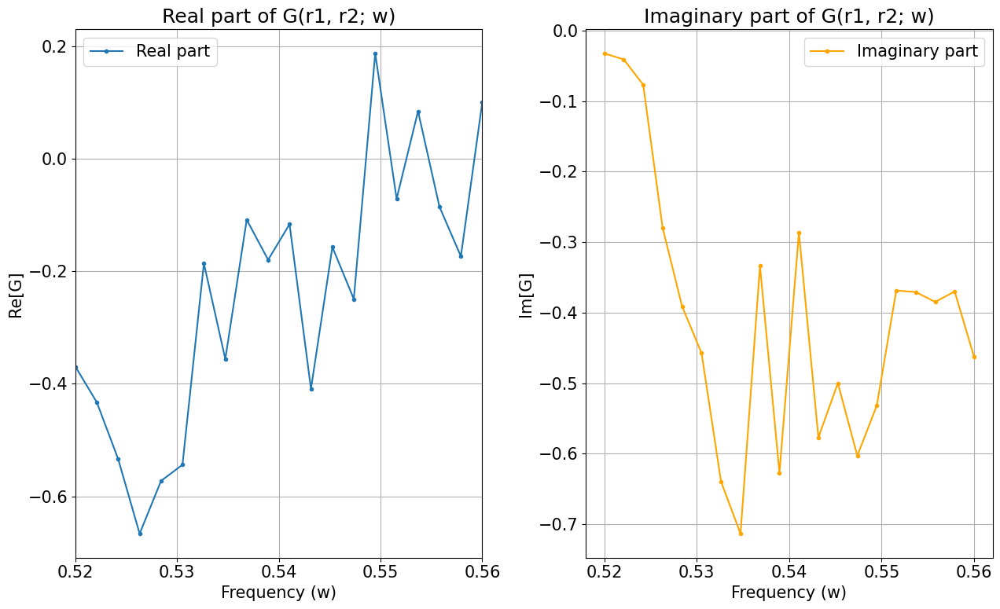

In [17]:
df = simulation.load_frequency_data("te")
from concurrent.futures import ThreadPoolExecutor
from tqdm import tqdm
def calculate_green_ij(name, w0, df, simulation, 
                       gamma=1e-3, polarization="te", max_workers=8):
    """
    Calculate the Green's tensor G_{ij}(r; w0) for a given frequency w0.
    
    Parameters:
        name (str): base filename for HDF5 files
        w0 (float): target frequency
        df (pd.DataFrame): DataFrame with columns ['k index', '<pol> band n']
        simulation: simulation object
        gamma (float): damping parameter
        polarization (str): polarization tag for filenames ("te", "tm", or "")
        max_workers (int): number of threads for parallel file I/O

    Returns:
        G (np.ndarray): complex array of shape (3, 3, Nx, Ny)
    """
    return compute_green_tensor(name, w0, df, simulation,
                                gamma=gamma, polarization=polarization,
                                max_workers=max_workers)

def load_field(name, k_idx, band_idx, simulation, polarization="te"):
    """
    Load the electric field components for a given k-point and band index.
    
    Parameters:
        name (str): base filename for HDF5 files
        k_idx (int): k-point index
        band_idx (int): band index
        simulation: simulation object
        polarization (str): polarization tag for filenames ("te", "tm", or "")


    Returns:
        E_vec (np.ndarray): stacked electric field components (3, Nx, Ny)
    """
    tag = polarization if polarization else ""
    ext = f".{tag}.h5" if tag else ".h5"
    fname = f"{name}-e.k{k_idx:02d}.b{band_idx:02d}{ext}"
    fullpath = os.path.join(simulation.directory, fname)
    data = simulation.load_h5_data(fullpath)
    # Extract electric field components and stack them
    Ex = data["x.r"] + 1j * data["x.i"]
    Ey = data["y.r"] + 1j * data["y.i"]
    Ez = data["z.r"] + 1j * data["z.i"]
    E_vec = np.stack((Ex, Ey, Ez), axis=2)
    return E_vec



def interpolate_field_at_point(field: np.ndarray, r: tuple) -> float:
    """
    Interpolate the field at a specific point r using nearest‐neighbor.

    Parameters:
        field (np.ndarray): field data of shape (Nx, Ny, 3)
        r (tuple): (x, y) coordinates to interpolate at,
                   assumed in the range [-0.5, 0.5] for both axes

    Returns:
        Ex(r), Ey(r), Ez(r): interpolated field components at r
    """
    x, y = r
    Nx, Ny = field.shape[0:2]

    # Map x in [-0.5,0.5] to i in [0, Nx-1]
    ix = int(round((x + 0.5) * (Nx - 1)))
    iy = int(round((y + 0.5) * (Ny - 1)))

    # Clamp indices to valid range
    ix = max(0, min(Nx - 1, ix))
    iy = max(0, min(Ny - 1, iy))

    return field[ix, iy, ...]


def compute_dot_product(dipole, field_r):   
    """
    Compute the dot product of the field at point r with a dipole moment vector.

    Parameters:
        dipole (np.ndarray): dipole moment vector, shape (3,)
        field_r (np.ndarray): field data at point r, shape (3,)
        

    Returns:
        float: dot product of field and dipole
    """

    return np.dot(dipole, field_r)


def compute_numerator(dipole1, dipole2, field1, field2):
    """
    Compute the numerator for the Green's tensor calculation.

    Parameters:
        dipole1 (np.ndarray): first dipole moment vector
        dipole2 (np.ndarray): second dipole moment vector
        field1 (np.ndarray): field data at point r1, shape (3,)
        field2 (np.ndarray): field data at point r2, shape (3,)

    Returns:
        float: numerator value
    """
    return compute_dot_product(dipole1, field1) * compute_dot_product(dipole2, np.conj(field1))





def compute_green_tensor(name, df, simulation, 
                         dipole1, dipole2,
                         r1, r2,
                         w, 
                         gamma=1e-3, 
                         polarization="te", max_workers=8):
    """
    Compute the MPB-normalized Green's tensor G_{ij}(r; u0) 
    on the 2D simulation grid using multithreading for I/O.

    Parameters:
        name (str): base filename for HDF5 files (without extension)
        u0 (float): target frequency
        df (pd.DataFrame): DataFrame with columns ['k index', '<pol> band n']
        simulation: simulation object with attributes `directory` and method
                    `load_h5_data(fullpath)` returning dict of fields
        gamma (float): damping parameter to regularize denominator
        polarization (str): polarization tag for filenames ("te", "tm", or "")
        max_workers (int): number of threads for parallel file I/O

    Returns:
        G (np.ndarray): complex array of shape (3, 3, Nx, Ny)
    """
    # Unique k-point indices and number
    k_indices = df["k index"].unique()
    Nk = len(k_indices)


    # Load first field to get grid shape
    first_k = k_indices[0]
    band_cols = [col for col in df.columns if col.startswith(f"{polarization} band".strip())]
    first_band = int(band_cols[0].split()[-1])
    E0 = load_field(name, first_k, first_band, simulation, polarization)
    Nx, Ny, _ = E0.shape

    prefactor = 1.0 / (4 * np.pi**2 * Nk)

    tasks = [(k_idx, int(col.split()[-1]), df.loc[df["k index"]==k_idx, col].item())
              for k_idx in k_indices for col in band_cols]
    print(f"Tasks to compute:" , tasks)

    G = 0
    def worker(args):
        k_idx, band_idx, wn = args
        E_vec = load_field(name, k_idx, band_idx, simulation, polarization)
        field1 = interpolate_field_at_point(E_vec, r1)
        field2 = interpolate_field_at_point(E_vec, r2)
        numerator = compute_numerator(dipole1, dipole2, field1, field2)
        denom = (w + 1j * gamma)**2 - wn**2
        return prefactor * numerator / denom

    with ThreadPoolExecutor(max_workers=max_workers) as executor:
        for contrib in executor.map(worker, tasks, chunksize=len(tasks)//max_workers or 1):
            G += contrib

    return G

def compute_geeen_tensor_vs_frequency(name, df, simulation,
                            dipole1, dipole2,
                            r1, r2,
                            w_list, 
                            gamma=1e-3, 
                            polarization="", max_workers=8):
    """
    Compute G(r1, r2; w) for a list of frequencies w.
    Parameters:
        name (str): base filename for HDF5 files
        df (pd.DataFrame): DataFrame with columns ['k index', '<pol> band n']
        simulation: simulation object
        dipole1 (np.ndarray): first dipole moment vector
        dipole2 (np.ndarray): second dipole moment vector
        r1 (tuple): coordinates of the first point r1
        r2 (tuple): coordinates of the second point r2
        w_list (array-like): frequencies to evaluate
        gamma (float): damping parameter
        polarization (str): polarization tag for filenames ("te", "tm", or "")
        max_workers (int): number of threads for parallel file I/O
    Returns:
        w_array (np.ndarray), G_vec (np.ndarray): frequencies and Green's tensor values
    """
    # Preallocate result array
    G_vec = np.zeros(len(w_list), dtype=complex)
    for i, w in enumerate(tqdm(w_list, desc="Green's tensor vs frequency")):
        G_vec[i] = compute_green_tensor(name, df, simulation,
                                        dipole1=dipole1, dipole2=dipole2,
                                        r1=r1, r2=r2,
                                        w=w, gamma=gamma,
                                        polarization=polarization,
                                        max_workers=max_workers)
    return np.array(w_list), G_vec


w_list = np.linspace(0.52, 0.56, 20)
r1 = (0.0, 0.0)  # Center of the grid
r2 = (0.0, 0.0)  # Same point for simplicity
dipole1 = np.array([1.0, 0.0,0])  # Example dipole moment vector
dipole2 = np.array([1.0, 0.0,0])  # Another dipole moment vector

w_array, G_vec = compute_geeen_tensor_vs_frequency(name, df, simulation,
                                                   dipole1, dipole2,
                                                   r1, r2, w_list,
                                                   gamma=1e-3, polarization='te',
                                                   max_workers=20)

fig, axs = plt.subplots(1, 2, figsize=(13, 8))
# Real part
axs[0].plot(w_array, np.real(G_vec), label='Real part', marker='.')
axs[0].set_xlim(w_array.min(), w_array.max())
axs[0].set_xlabel('Frequency (w)')
axs[0].set_ylabel('Re[G]')
axs[0].set_title('Real part of G(r1, r2; w)')
# Imaginary part
axs[1].plot(w_array, np.imag(G_vec), label='Imaginary part', color='orange', marker='.')
axs[1].set_xlabel('Frequency (w)')
axs[1].set_ylabel('Im[G]')
axs[1].set_title('Imaginary part of G(r1, r2; w)')
axs[0].grid(True)
axs[1].grid(True)
axs[0].legend()
axs[1].legend()
plt.tight_layout()
plt.show()
